In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
### install dependencies:

# might need to install opencv
!pip3 install Cython cupy-cuda112 cupy-cuda102   # Probably only need one of these but it works so I'm gonna leave it for now.
!pip3 install pyyaml==5.1

# Torch 1.8.1 does not work despite being the latest stable release. As such, use 1.7. 
# Cuda version on MAGEOHub is currently 11.3 - cu110 all works fine.

# To be tried once the bug with torch 1.8 has been fixed 
#!pip3 install torch==1.8.1+cu111 torchvision==0.9.1+cu111 torchaudio==0.8.1 -f https://download.pytorch.org/whl/torch_stable.html

!pip install torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html
!python -m pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu110/torch1.7/index.html

     |████████████████████████████████| 75.9 MB 5.8 kB/s 
     |████████████████████████████████| 60.7 MB 68 kB/s 
     |████████████████████████████████| 274 kB 7.7 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=3be822cc0df983caf465e123d1c2ced16044274ced4ccfa7a076704924951340
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |███████████████████████         | 834.1 MB 1.3 MB/s eta 0:04:18tcmalloc: large alloc 1147494400 bytes == 0x56219fe6a000 @  0x7f8e7c50f615 0x5621663ac4cc 0x56216648c47a 0x5621663af2ed 0x5621664a0e1d 0x562166422e99 0x56216641d9ee 0x5621663b0bda 0x562166422d00 0x56216641d9ee 0x5621663b0bda 0x56216641f737 0x5621664

In [ ]:
# install geospatial dependencies

!pip -q install rasterio
!pip -q install fiona
!pip -q install geopandas

In [ ]:
# import libraries for visualisation

!pip -q install holoviews geoviews hvplot

In [2]:
# Import torch and check versions and cuda availability, and resources
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
!nvcc --version
!nvidia-smi

from IPython.display import display, clear_output

1.7.1+cu110 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
Thu Oct 14 11:06:05 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.74       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|=========================

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
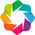

In [30]:
# Import necessary parts of detectron2
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import ColorMode
from detectron2.engine import DefaultTrainer

# tensorboard?
#%load_ext tensorboard
#%tensorboard --logdir output

# necessary libraries
import pandas as pd
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt
from PIL import Image
import os
import numpy as np
import json
import glob
import urllib

# import geospatial libraries
import rasterio
from rasterio.transform import from_origin
import rasterio.features

import fiona

from shapely.geometry import shape, mapping, box
from shapely.geometry.multipolygon import MultiPolygon

#from google.colab.patches import cv2_imshow

# import visualisation libraries

import holoviews as hv
from IPython.display import display
import geoviews.tile_sources as gts

import hvplot.pandas
import hvplot.xarray

hv.extension('bokeh', width=100)

In [10]:
# Make sure the inevitable error messages are useful.
CUDA_LAUNCH_BLOCKING="1"

In [14]:
# define the URL to retrieve the model from Zenodo
fn = 'model_final.pth'
url = f'https://zenodo.org/record/5515408/files/{fn}?download=1'

urllib.request.urlretrieve(url, '/content/drive/Shareddrives/detectreegb/weights' + '/' + fn)

('/content/drive/Shareddrives/detectreegb/weights/model_final.pth',
 <http.client.HTTPMessage at 0x7f1c63d0c6d0>)

In [15]:
# Setup to predict on new images, here setting up for the trees_test dataset, but can also use this setup
# for predicting on individual images as seen 2 cells down

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

### path to the saved pre-trained model weights
cfg.MODEL.WEIGHTS = '/content/drive/Shareddrives/detectreegb/weights/model_final.pth'

# set confidence threshold at which we predict
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.15

predictor = DefaultPredictor(cfg)

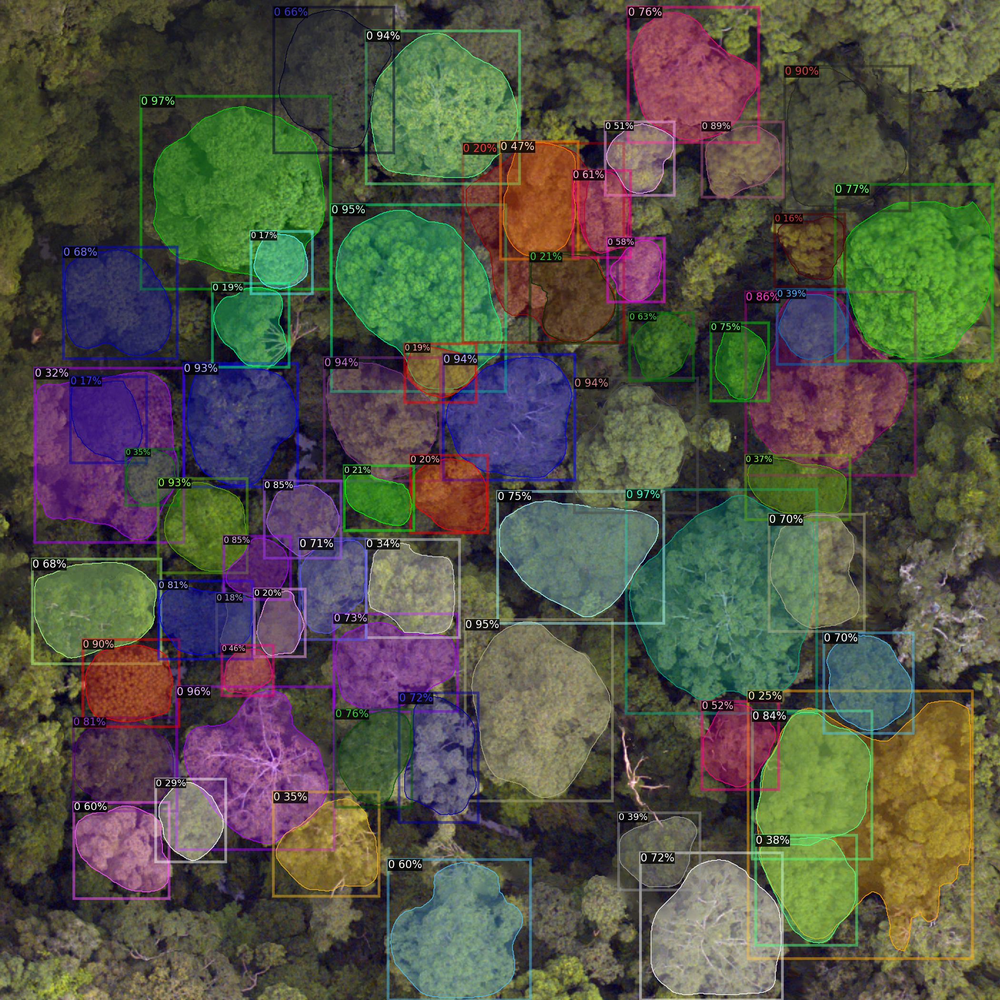

In [17]:
# make and visualise predictions, on a particular file, just to check these weights are working ok 

# give the image that we are trying to predict on

im = cv2.imread("/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_603000_646900.png")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], scale=1.5, instance_mode=ColorMode.IMAGE_BW)   # remove the colors of unsegmented pixels
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
image = cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)
display(Image.fromarray(image))

In [21]:
import glob

for filepath in glob.iglob('/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/*.png'):
    print(filepath)
    img = cv2.imread(filepath)
    outputs = predictor(img)
    mask_array = outputs['instances'].pred_masks.cpu().numpy()

    # get confidence scores too 
    mask_array_scores = outputs['instances'].scores.cpu().numpy()

    num_instances = mask_array.shape[0]
    mask_array_instance = []
    output = np.zeros_like(mask_array) 

    mask_array_instance.append(mask_array)
    output = np.where(mask_array_instance[0] == True, 255, output)
    fresh_output = output.astype(np.float)
    x_scaling = 140/fresh_output.shape[1]
    y_scaling = 140/fresh_output.shape[2]
    # this is an affine transform. This needs to be altered significantly.
    transform = from_origin(int(filepath[-17:-11])-20, int(filepath[-10:-4])+120, y_scaling, x_scaling)


    output_raster =  '/content/drive/Shareddrives/detectreegb/sepilok/outputs/rasters/' + 'predicted_raster_' + filepath[-17:-4]+ '.tif'

    new_dataset = rasterio.open(output_raster, 'w', driver='GTiff',
                                    height = fresh_output.shape[1], width = fresh_output.shape[2], count = fresh_output.shape[0],
                                    dtype=str(fresh_output.dtype),
                                    crs='+proj=utm +zone=50 +datum=WGS84 +units=m +no_defs',  
                                    transform=transform)

    new_dataset.write(fresh_output)
    new_dataset.close()

/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602800_647000.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602800_647200.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602800_647300.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602900_646800.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602900_646900.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602900_647000.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602900_647100.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602900_647200.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_603000_646900.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_603000_647000.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_603100_647200.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_603200_647300.png
/content/drive/S

In [40]:
# let's try for a single example

output_raster2 = '/content/drive/Shareddrives/detectreegb/sepilok/outputs/rasters/predicted_raster_602900_646900.tif'

with rasterio.open(output_raster2) as src:
    shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int', 'score': 'float'}}    

    crs = src.crs
    for i in range(src.count):
        src_band = src.read(i+1)
        src_band = np.float32(src_band)
        conf = mask_array_scores[i-2]
        # Keep track of unique pixel values in the input band
        unique_values = np.unique(src_band)
        # Polygonize with Rasterio. `shapes()` returns an iterable
        # of (geom, value) as tuples
        shapes = list(rasterio.features.shapes(src_band, transform=src.transform))
    



        if i == 0:
            with fiona.open('/content/drive/Shareddrives/detectreegb/sepilok/outputs/shapes/' + 'predicted_polygons_' + filepath[-17:-4] + '_' + str(0) + '.shp', 'w', 'ESRI Shapefile',
                            shp_schema, crs) as shp:
                polygons = [shape(geom) for geom, value in shapes if value == 255.0]                                        
                multipolygon = MultiPolygon(polygons)
                        # simplify not needed here
                        #multipolygon = multipolygon_a.simplify(0.1, preserve_topology=False)                    
                shp.write({
                          'geometry': mapping(multipolygon),
                          'properties': {'pixelvalue': int(unique_values[1]), 'score': float(conf)} 
                           })
        else:
            with fiona.open('/content/drive/Shareddrives/detectreegb/sepilok/outputs/shapes/' + 'predicted_polygons_' + filepath[-17:-4] + '_' + str(0)+'.shp', 'a', 'ESRI Shapefile',
                            shp_schema, crs) as shp:
                polygons = [shape(geom) for geom, value in shapes if value == 255.0]                                        
                multipolygon = MultiPolygon(polygons)
                        # simplify not needed here
                        #multipolygon = multipolygon_a.simplify(0.1, preserve_topology=False)                    
                shp.write({
                          'geometry': mapping(multipolygon),
                          'properties': {'pixelvalue': int(unique_values[1]), 'score': float(conf)} 
                           })
    

IndexError: ignored

In [41]:
# we need to unify this all into one cell...

import glob

for filepath in glob.iglob('/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/*.png'):
    print(filepath)
    img = cv2.imread(filepath)
    outputs = predictor(img)
    mask_array = outputs['instances'].pred_masks.cpu().numpy()

    # get confidence scores too 
    mask_array_scores = outputs['instances'].scores.cpu().numpy()

    num_instances = mask_array.shape[0]
    mask_array_instance = []
    output = np.zeros_like(mask_array) 

    mask_array_instance.append(mask_array)
    output = np.where(mask_array_instance[0] == True, 255, output)
    fresh_output = output.astype(np.float)
    x_scaling = 140/fresh_output.shape[1]
    y_scaling = 140/fresh_output.shape[2]
    # this is an affine transform. This needs to be altered significantly.
    transform = from_origin(int(filepath[-17:-11])-20, int(filepath[-10:-4])+120, y_scaling, x_scaling)


    output_raster =  '/content/drive/Shareddrives/detectreegb/sepilok/outputs/rasters/' + 'predicted_raster_' + filepath[-17:-4]+ '.tif'

    new_dataset = rasterio.open(output_raster, 'w', driver='GTiff',
                                    height = fresh_output.shape[1], width = fresh_output.shape[2], count = fresh_output.shape[0],
                                    dtype=str(fresh_output.dtype),
                                    crs='+proj=utm +zone=50 +datum=WGS84 +units=m +no_defs',  
                                    transform=transform)

    new_dataset.write(fresh_output)
    new_dataset.close()

    with rasterio.open(output_raster) as src:
        shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int', 'score': 'float'}}    

        crs = src.crs
        for i in range(src.count):
            src_band = src.read(i+1)
            src_band = np.float32(src_band)
            conf = mask_array_scores[i-2]
            # Keep track of unique pixel values in the input band
            unique_values = np.unique(src_band)
            # Polygonize with Rasterio. `shapes()` returns an iterable
            # of (geom, value) as tuples
            shapes = list(rasterio.features.shapes(src_band, transform=src.transform))
        



            if i == 0:
                with fiona.open('/content/drive/Shareddrives/detectreegb/sepilok/outputs/shapes/' + 'predicted_polygons_' + filepath[-17:-4] + '_' + str(0) + '.shp', 'w', 'ESRI Shapefile',
                                shp_schema, crs) as shp:
                    polygons = [shape(geom) for geom, value in shapes if value == 255.0]                                        
                    multipolygon = MultiPolygon(polygons)
                            # simplify not needed here
                            #multipolygon = multipolygon_a.simplify(0.1, preserve_topology=False)                    
                    shp.write({
                              'geometry': mapping(multipolygon),
                              'properties': {'pixelvalue': int(unique_values[1]), 'score': float(conf)} 
                              })
            else:
                with fiona.open('/content/drive/Shareddrives/detectreegb/sepilok/outputs/shapes/' + 'predicted_polygons_' + filepath[-17:-4] + '_' + str(0)+'.shp', 'a', 'ESRI Shapefile',
                                shp_schema, crs) as shp:
                    polygons = [shape(geom) for geom, value in shapes if value == 255.0]                                        
                    multipolygon = MultiPolygon(polygons)
                            # simplify not needed here
                            #multipolygon = multipolygon_a.simplify(0.1, preserve_topology=False)                    
                    shp.write({
                              'geometry': mapping(multipolygon),
                              'properties': {'pixelvalue': int(unique_values[1]), 'score': float(conf)} 
                              })
        


/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602800_647000.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602800_647200.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602800_647300.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602900_646800.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602900_646900.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602900_647000.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602900_647100.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_602900_647200.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_603000_646900.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_603000_647000.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_603100_647200.png
/content/drive/Shareddrives/detectreegb/sepilok/tiles/pngs/tile_603200_647300.png
/content/drive/S

In [42]:
import pandas as pd
import geopandas as gpd

gdf1 = gpd.read_file('/content/drive/Shareddrives/detectreegb/sepilok/outputs/shapes/predicted_polygons_602800_647000_0.shp')
gdf2 = gpd.read_file('/content/drive/Shareddrives/detectreegb/sepilok/outputs/shapes/predicted_polygons_602800_647200_0.shp')
gdf3 = gpd.read_file('/content/drive/Shareddrives/detectreegb/sepilok/outputs/shapes/predicted_polygons_602800_647300_0.shp')

grouped_gdf = gpd.GeoDataFrame(pd.concat([gdf1, gdf2, gdf3]))

In [43]:
plot_vector = grouped_gdf.hvplot(hover_cols=['score']).opts(fill_color=None,line_color='red',alpha=0.8, width=800, height=600)

plot_vector

:Polygons   [x,y]   (score)

In [44]:
hvplot.save(plot_vector, '/content/drive/Shareddrives/detectreegb/sepilok/outputs/interactive_plots/combined_plot.html')

In [ ]:
# load and plot polygons
in_shp = glob.glob(config['out_shapefile'] + '/*.shp')

poly_df = gpd.read_file(in_shp[0])

plot_vector = poly_df.hvplot(hover_cols=['score']).opts(fill_color=None,line_color='red',alpha=0.8, width=800, height=600)

plot_vector

In [ ]:
##### IGNORE THESE ONES

### THIS WORKS BRILLIANTLY
### It reads in a stack raster of all the predictions, and outputs n shapefiles, where n 
### is the number of predictions for that particular image. 
### We can then merge all these predictions. 

# Another way to polygonise all the bands of my raster

import numpy as np
import fiona
import rasterio
import rasterio.features
from shapely.geometry import shape, mapping
from shapely.geometry.multipolygon import MultiPolygon
#from shapely.geometry import Polygon


# Read input band with Rasterio
for output_raster in glob.iglob('/home/jovyan/lustre_scratch/paracou_data/plots_6_and_13_preds/*.tif'):
    print(output_raster)
    with rasterio.open(output_raster) as src:
        shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int', 'score': 'float'}}    

        crs = src.crs
        for i in range(src.count):
            src_band = src.read(i+1)
            src_band = np.float32(src_band)
            conf = mask_array_scores[i]
            # Keep track of unique pixel values in the input band
            unique_values = np.unique(src_band)
            # Polygonize with Rasterio. `shapes()` returns an iterable
            # of (geom, value) as tuples
            shapes = list(rasterio.features.shapes(src_band, transform=src.transform))
        



            if i == 0:
                with fiona.open(config['out_shapefile'] + '/predicted_polygons_' + filepath[-17:-4] + '_' + str(0) + '.shp', 'w', 'ESRI Shapefile',
                                shp_schema, crs) as shp:
                    polygons = [shape(geom) for geom, value in shapes if value == 255.0]                                        
                    multipolygon = MultiPolygon(polygons)
                            # simplify not needed here
                            #multipolygon = multipolygon_a.simplify(0.1, preserve_topology=False)                    
                    shp.write({
                              'geometry': mapping(multipolygon),
                              'properties': {'pixelvalue': int(unique_values[1]), 'score': float(conf)} 
                              })
            else:
                with fiona.open(config['out_shapefile'] + '/predicted_polygons_' + filepath[-17:-4] + '_' + str(0)+'.shp', 'a', 'ESRI Shapefile',
                                shp_schema, crs) as shp:
                    polygons = [shape(geom) for geom, value in shapes if value == 255.0]                                        
                    multipolygon = MultiPolygon(polygons)
                            # simplify not needed here
                            #multipolygon = multipolygon_a.simplify(0.1, preserve_topology=False)                    
                    shp.write({
                              'geometry': mapping(multipolygon),
                              'properties': {'pixelvalue': int(unique_values[1]), 'score': float(conf)} 
                              })
        

In [ ]:
### THIS WORKS BRILLIANTLY
### It reads in a stack raster of all the predictions, and outputs n shapefiles, where n 
### is the number of predictions for that particular image. 
### We can then merge all these predictions. 

# Another way to polygonise all the bands of my raster

import numpy as np
import fiona
import rasterio
import rasterio.features
from shapely.geometry import shape, mapping
from shapely.geometry.multipolygon import MultiPolygon
#from shapely.geometry import Polygon


# Read input band with Rasterio
for output_raster in glob.iglob('/home/jovyan/lustre_scratch/paracou_data/plots_6_and_13_preds/*.tif'):
    print(output_raster)
    with rasterio.open(output_raster) as src:
        shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int', 'score': 'float'}}    

        crs = src.crs
        for i in range(src.count):
            src_band = src.read(i+1)
            src_band = np.float32(src_band)
            conf = mask_array_scores[i]
            # Keep track of unique pixel values in the input band
            unique_values = np.unique(src_band)
            # Polygonize with Rasterio. `shapes()` returns an iterable
            # of (geom, value) as tuples
            shapes = list(rasterio.features.shapes(src_band, transform=src.transform))
        



            if i == 0:
                with fiona.open(config['out_shapefile'] + '/predicted_polygons_' + filepath[-17:-4] + '_' + str(0) + '.shp', 'w', 'ESRI Shapefile',
                                shp_schema, crs) as shp:
                    polygons = [shape(geom) for geom, value in shapes if value == 255.0]                                        
                    multipolygon = MultiPolygon(polygons)
                            # simplify not needed here
                            #multipolygon = multipolygon_a.simplify(0.1, preserve_topology=False)                    
                    shp.write({
                              'geometry': mapping(multipolygon),
                              'properties': {'pixelvalue': int(unique_values[1]), 'score': float(conf)} 
                              })
            else:
                with fiona.open(config['out_shapefile'] + '/predicted_polygons_' + filepath[-17:-4] + '_' + str(0)+'.shp', 'a', 'ESRI Shapefile',
                                shp_schema, crs) as shp:
                    polygons = [shape(geom) for geom, value in shapes if value == 255.0]                                        
                    multipolygon = MultiPolygon(polygons)
                            # simplify not needed here
                            #multipolygon = multipolygon_a.simplify(0.1, preserve_topology=False)                    
                    shp.write({
                              'geometry': mapping(multipolygon),
                              'properties': {'pixelvalue': int(unique_values[1]), 'score': float(conf)} 
                              })
        

In [ ]:
#### IGNORE THESE ONES


filepath = '/home/jovyan/lustre_scratch/sepilok_data/spare_pngs/tile_603000_646900.png'
im = cv2.imread(filepath)
outputs = predictor(im)

mask_array = outputs['instances'].pred_masks.cpu().numpy()
    
# get confidence scores too 
# mask_array_scores = outputs['instances']['scores'].pred_masks.cpu().numpy()
    
num_instances = mask_array.shape[0]
#print(num_instances)
mask_array_instance = []
# create an array of the right shape
output = np.zeros_like(mask_array) 
#print('output',output.shape)

mask_array_instance.append(mask_array)
output = np.where(mask_array_instance[0] == True, 255, output)
#print(output)
#print(mask_array_instance)
fresh_output = output.astype(np.float)
#print(fresh_output.shape)
x_scaling = 140/fresh_output.shape[1]
y_scaling = 140/fresh_output.shape[2]
# this is an affine transform. This needs to be altered significantly.
transform = from_origin(int(filepath[-17:-11])-20, int(filepath[-10:-4])+120, y_scaling, x_scaling)

new_dataset = rasterio.open('/home/jovyan/lustre_scratch/10_predicted_polygons_'+filepath[-17:-4]+'.tif', 'w', driver='GTiff',
                             height = fresh_output.shape[1], width = fresh_output.shape[2], count = fresh_output.shape[0],
                             dtype=str(fresh_output.dtype),
                             crs='+proj=utm +zone=22 +datum=WGS84 +units=m +no_defs',  
                             transform=transform)

new_dataset.write(fresh_output)
new_dataset.close()


In [ ]:
### THIS WORKS BRILLIANTLY
### It reads in a stack raster of all the predictions, and outputs n shapefiles, where n 
### is the number of predictions for that particular image. 
### We can then merge all these predictions...need to do this in python 

#### extract confidence from the predictions to include as a column in the shapefile

# Another way to polygonise all the bands of my raster

import numpy as np
import fiona
import rasterio
import rasterio.features
from shapely.geometry import shape, mapping
from shapely.geometry.multipolygon import MultiPolygon
#from shapely.geometry import Polygon


# Read input band with Rasterio
tiff_filepath = '/home/jovyan/lustre_scratch/10_predicted_polygons_603000_646900.tif'
with rasterio.open(filepath) as src:
    shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int'}}
    
    crs = src.crs
    for i in range(src.count):
        src_band = src.read(i+1)
        src_band = np.float32(src_band)
        #score = array[i]
        #print(src_band.dtype)
        # Keep track of unique pixel values in the input band
        unique_values = np.unique(src_band)
        # Polygonize with Rasterio. `shapes()` returns an iterable
        # of (geom, value) as tuples
        shapes = list(rasterio.features.shapes(src_band, transform=src.transform))


# simplify here

# Get a list of all polygons for a given pixel value
# and create a MultiPolygon geometry with shapely.
# Then write the record to an output shapefile with fiona.
# We make use of the `shape()` and `mapping()` functions from
# shapely to translate between the GeoJSON-like dict format
# and the shapely geometry type.
##### Don't forget to add this folder here!
### change ' w' to 'a' to append....

        with fiona.open('/home/jovyan/lustre_scratch/folder/10_predicted_polygons_'+filepath[-17:-4]+'_'+str(i)+'.shp', 'w', 'ESRI Shapefile', shp_schema, crs) as shp:
            for pixel_value in unique_values:
                polygons = [shape(geom) for geom, value in shapes
                            if value == pixel_value]
                multipolygon = MultiPolygon(polygons)
                shp.write({
                    'geometry': mapping(multipolygon),
                    'properties': {'pixelvalue': int(pixel_value)}   # 'score': {mask_array_score[i]}
                        })

In [ ]:
### zip up the folder to download
import shutil

shutil.make_archive("/home/jovyan/lustre_scratch/folder/zipped_set_shapefiles", "zip", "/home/jovyan/lustre_scratch/paracou_data/folder")

#zip -r /home/jovyan/lustre_scratch/sepilok_data/all_sepilok_preds_shapes.zip /home/jovyan/lustre_scratch/sepilok_data/all_sepilok_preds_shapes